# Random vector generation

Initial commands

In [1]:
from sympy import symbols,integrate,lambdify
from sympy.solvers import solve
from pylab import meshgrid
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf') #setting figure format to vector when exported
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['text.usetex'] = True
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import MultipleLocator,MaxNLocator,FormatStrFormatter
import time
import random

## Calculating the $a$

In [2]:
b=12 #birhtday month
a=symbols('a') #we have to find the value of a (b is month of my birthday), such that the value of integral is 1
x=symbols('x')
y=symbols('y')
i_y=integrate(a*x,(y,0,x)) #inner integral (y)
print('integral i_y is: {}'.format(i_y)+'.')
i_x=integrate(i_y,(x,0,b)) #outer integral (x)
print('integral i_x is: {}'.format(i_x)+'.')

a=solve(i_x-1,a) #The value of integral is 1
a=float(a[0])
print('a is: {}'.format(a)+'.')

integral i_y is: a*x**2.
integral i_x is: 576*a.
a is: 0.001736111111111111.


## Drawing a graph of PDF $f_{XY}(x,y)$

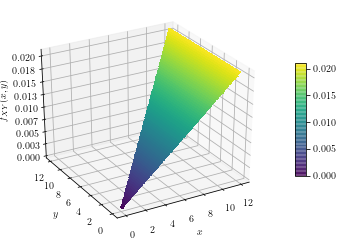

In [3]:
fXY=lambdify((x,y),a*x) #y goes from 0 to x!
x=np.linspace(0,b,1001,endpoint=True)
y=np.linspace(0,b,1001,endpoint=True)
#X,Y=meshgrid(x,y) #grid of point

X=np.zeros((len(y),len(x)))
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
            X[i][j]=x[j]
            
Y=np.zeros((len(y),len(x)))
for i in range(Y.shape[0]):
    for j in range(Y.shape[1]):
        if y[i]<=1*x[j]: #here you write x-y relationship for domain of a random vector X,Y (in this case 0<=y<=1*x+0)
            Y[i][j]=y[i]
            
Z=fXY(X,Y)
            
#2D plot, to check if fXY is defined in the correct domain
'''
plt.contour(X,Y,Z,100,cmap='viridis')
plt.plot(x,1*x+0,color='red')
plt.show()'''
           
#3D plot
fig=plt.figure(figsize=(12/2.54,8/2.54))
ax=fig.gca(projection='3d')
ax.set_xlabel('$x$')
ax.xaxis.set_major_locator(MultipleLocator(2))
ax.set_ylabel('$y$')
ax.yaxis.set_major_locator(MultipleLocator(2))
ax.set_zlabel('$f_{XY}(x,y)$',rotation=90)
ax.view_init(azim=-120,elev=30)
ax.zaxis.set_rotate_label(False)
ax.zaxis.set_major_formatter(FormatStrFormatter('%.03f'))
surf=ax.contour3D(X,Y,Z,100,cmap='viridis',antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=10,format=FormatStrFormatter('%.03f'),ticks=MaxNLocator(5))
plt.tight_layout(pad=0.1)
#plt.savefig('fXY_theor',dpi=500)
plt.show()

## Derivation of marginal PDFs

### $f_X(x)$

fX(x) is: 0.00173611111111111*x**2.
Area under the fX(x) is: 1.000


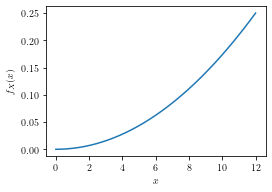

In [4]:
x=symbols('x')
y=symbols('y')
fX=lambdify((x),integrate(fXY(x,y),(y,0,x))) #y goes from 0 to x!
print('fX(x) is: {}'.format(fX(x))+'.')

#Checking area under the fX(x)
print('Area under the fX(x) is: {:.3f}'.format(integrate(fX(x),(x,0,b))))

#Plot
x_val=np.linspace(0,b,1001,endpoint=True)
fX_val=np.array([fX(xi) for xi in x_val])
plt.figure(figsize=(10/2.54,7/2.54))
plt.plot(x_val,fX_val)
plt.xlabel('$x$')
plt.ylabel('$f_X(x)$')
plt.show()

### $f_Y(y)$

fY(y) is: 0.125 - 0.000868055555555555*y**2.
Area under the fY(y) is: 1.000


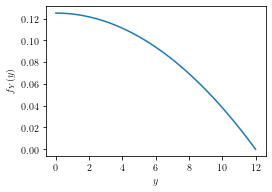

In [5]:
fY=lambdify((y),integrate(fXY(x,y),(x,y,b))) #x goes from y to b!
print('fY(y) is: {}'.format(fY(y))+'.')

#Checking area under the fX(x)
print('Area under the fY(y) is: {:.3f}'.format(integrate(fY(y),(y,0,b))))

#Plot
y_val=np.linspace(0,b,1001,endpoint=True)
fY_val=np.array([fY(yi) for yi in y_val])
plt.figure(figsize=(10/2.54,7/2.54))
plt.plot(y_val,fY_val)
plt.xlabel('$y$')
plt.ylabel('$f_Y(y)$')
plt.show()

## Derivation of conditional PDFs

### $f_{X|Y=y}(x)$

fX_Y(x) is: 0.00173611111111111*x/(0.125 - 0.000868055555555555*y**2).
Area under the fX|Y=2(x) is: 1.000.


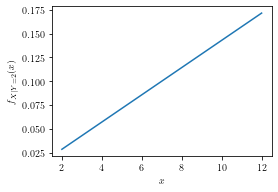

In [6]:
x=symbols('x')
y=symbols('y')
fX_Y=lambdify((x,y),fXY(x,y)/fY(y))
print('fX_Y(x) is: {}'.format(fX_Y(x,y))+'.')

y=2 #selected y

#Checking area under the fX|Y(x)
print('Area under the fX|Y='+str(y)+'(x) is: {:.3f}'.format(integrate(fX_Y(x,y),(x,y,b)))+'.')

#Plot
x_val=np.linspace(y,b,1001,endpoint=True) #x goes from y to b
fX_Y_val=np.array([fX_Y(xi,y) for xi in x_val])
plt.figure(figsize=(10/2.54,7/2.54))
plt.plot(x_val,fX_Y_val)
plt.xlabel('$x$')
plt.ylabel('$f_{X|Y='+str(y)+'}(x)$')
plt.show()

### $f_{Y|X=x}(y)$

fY_X(y) is: 1.0/x.
Area under the fY|X=2(y) is: 1.000.


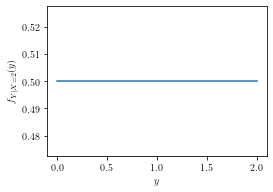

In [7]:
x=symbols('x')
y=symbols('y')
fY_X=lambdify((x,y),fXY(x,y)/fX(x))
print('fY_X(y) is: {}'.format(fY_X(x,y))+'.')

x=2 #selected x

#Checking area under the fY|X(y)
print('Area under the fY|X='+str(x)+'(y) is: {:.3f}'.format(integrate(fY_X(x,y),(y,0,x)))+'.')

#Plot
y_val=np.linspace(0,x,1001,endpoint=True) #y goes from 0 to x
fY_X_val=np.array([fY_X(x,yi) for yi in y_val])
plt.figure(figsize=(10/2.54,7/2.54))
plt.plot(y_val,fY_X_val)
plt.xlabel('$y$')
plt.ylabel('$f_{Y|X='+str(x)+'}(y)$')
plt.show()

## Generating a sample of 10000 $X_i$, $Y_i$ using inverse method

In [8]:
x=symbols('x')
y=symbols('y')
x_=symbols('x_')
y_=symbols('y_')
z=symbols('z')

FX=lambdify((x),integrate(fX(x_),(x_,0,x)))
print('FX(x) is: {}'.format(FX(x))+'.')

FY=lambdify((y),integrate(fY(y_),(y_,0,y)))
print('FY(y) is: {}'.format(FY(y))+'.')

FX_inverse=lambdify((z),solve(FX(x)-z,x)[0])
print('FX_inverse(x) is: {}'.format(FX_inverse(x))+'.')

FY_X=lambdify((x,y),integrate(fY_X(x,y),(y_,0,y)))
print('FY_X(x,y) is: {}'.format(FY_X(x,y))+'.')

FY_X_inverse=lambdify((x,z),solve(FY_X(x,y)-z,y)[0])
print('FY_X_inverse(x,z) is: {}'.format(FY_X_inverse(x,z))+'.')

FX(x) is: 0.000578703703703703*x**3.
FY(y) is: -0.000289351851851852*y**3 + 0.125*y.
FX_inverse(x) is: 12.0*x**0.333333333333333.
FY_X(x,y) is: 1.0*y/x.
FY_X_inverse(x,z) is: x*z.


Performing simulations

In [9]:
start=time.time() #start counting the (CPU) time
n=10000
u_x=[random.random() for i in range(n)]
xlist=[FX_inverse(val)for c,val in enumerate(u_x)]
u_y=[random.random() for i in range(n)]
ylist=[FY_X_inverse(xlist[c],val) for c,val in enumerate(u_y)]
elapsedTimeInverse=(time.time()-start)
print('Elapsed time for inverse method is: {} s'.format(elapsedTimeInverse))

Elapsed time for inverse method is: 0.010977029800415039 s


Plot

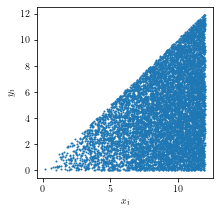

In [10]:
plt.figure(figsize=(8/2.54,8/2.54))
plt.scatter(xlist,ylist,s=1)
plt.xlabel('$x_i$')
plt.ylabel('$y_i$')
plt.show()

## Generating a sample of 10000 $X_i$, $Y_i$ using accept/reject method

In [11]:
#Storing only inside points
start=time.time() #start counting the (CPU) time
inside=[]

while np.shape(inside)[0]<=(n-1):
    x=b*random.random()
    y=b*random.random()
    z=a*b*random.random()
    if y<=x:
        if z<=a*x:
            inside.append([x,y,z])
        
elapsedTimeAccRej=(time.time()-start)
print('Elapsed time for accept/reject method (1) is: {} s'.format(elapsedTimeAccRej))              

Elapsed time for accept/reject method (1) is: 46.88236355781555 s


In [12]:
#Storing both inside and outside points
start=time.time() #start counting the (CPU) time
inside=[]
outside=[]

while np.shape(inside)[0]<=(n-1):
    x=b*random.random()
    y=b*random.random()
    z=a*b*random.random()
    if y<=x:
        if z<=a*x:
            inside.append([x,y,z])
        else:
            outside.append([x,y,z])
    else:
        outside.append([x,y,z])
        
elapsedTimeAccRej=(time.time()-start)
print('Elapsed time for accept/reject method (2) is: {} s'.format(elapsedTimeAccRej))              

Elapsed time for accept/reject method (2) is: 49.004279375076294 s


Plot

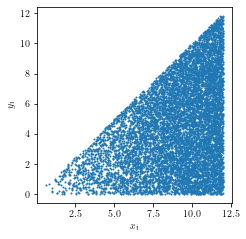

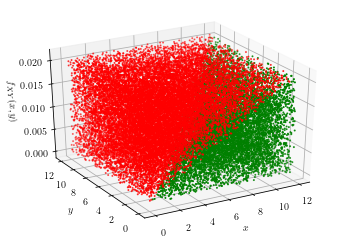

In [13]:
#2D plot
plt.figure(figsize=(8/2.54,8/2.54))
plt.scatter(list(zip(*inside))[0],list(zip(*inside))[1],s=1)
plt.xlabel('$x_i$')
plt.ylabel('$y_i$')
plt.tight_layout(pad=0.1)
plt.show()              

#3D plot        
fig = plt.figure(figsize=(12/2.54,8/2.54))
ax = plt.axes(projection='3d')
ax.scatter3D(list(zip(*inside))[0],list(zip(*inside))[1],list(zip(*inside))[2],c='green',s=1) #The zip() function takes iterables (can be zero or more), aggregates them in a tuple, and return it.
ax.scatter3D(list(zip(*outside))[0],list(zip(*outside))[1],list(zip(*outside))[2],c='red',s=1)
ax.view_init(azim=-120,elev=30)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$f_{XY}(x,y)$')
plt.tight_layout(pad=0.1)
plt.show()   